In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import os

import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.metrics import adjusted_rand_score as ARI
from sklearn.metrics import adjusted_mutual_info_score as AMI

from scipy import sparse
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (7,7)
import seaborn as sns
from scipy import sparse
# import muon as mu
# Import a module with ATAC-seq-related functions
# from muon import atac as ac
sc.settings.verbosity =0

In [2]:
import episcanpy as epi

In [3]:
sample_color_dic = {'lib_09': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 'lib_10': (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 'lib_15': (1.0, 0.4980392156862745, 0.054901960784313725),
 'lib_23': (1.0, 0.7333333333333333, 0.47058823529411764),
 'lib_29': (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 'lib_34': (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 'lib_36': (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 'lib_38': (1.0, 0.596078431372549, 0.5882352941176471),
 'lib_51': (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 'lib_54': (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 'lib_55': (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 'lib_56': (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 'lib_57': (0.8901960784313725, 0.4666666666666667, 0.7607843137254902)}

def comparison_heatmap(adata, key1, key2, label_1=None, label_2=None, cmap = 'Reds', annot = True, figsize=(7,7)):
    if label_1==None:
        label_1=key1
    if label_2==None:
        label_2=key2
    expected_df = adata.obs[[key1,key2]].groupby(by=[key2,key1]).size().reset_index(name = 'count')
    counts = np.array(expected_df['count'].tolist())
    df = pd.DataFrame(counts.reshape(((len(adata.obs[key2].cat.categories),len(adata.obs[key1].cat.categories)))), index = expected_df[key2].unique(), columns = expected_df[key1].unique())
    if annot ==True:
        annot_ = df.astype(int)
        sc.settings.set_figure_params(figsize=figsize, color_map='gist_earth')
    else:
        annot_=None
        sc.settings.set_figure_params(figsize=figsize, color_map='gist_earth')
    s = sns.heatmap(df/np.sum(df,axis = 0), cbar_kws={'label': '% cell shared between annotations'}, cmap=cmap, vmax=1, vmin=0, annot = annot_,  fmt='.7g')
    s.set_ylabel(label_2, fontsize=12)
    s.set_xlabel(label_1, fontsize = 12)
    return df

def n_cells_histogram(adata, sample_key='sample', sample_color_dic = sample_color_dic):
    df = pd.DataFrame(adata.obs[sample_key].value_counts().index, index = adata.obs[sample_key].value_counts().index  , columns =[ sample_key ])
    df['n_cells'] = adata.obs[sample_key].value_counts().values.astype(int)
    df.reindex(index=np.argsort(df['n_cells']).index.tolist()[::-1]).plot(kind='bar', x = sample_key, y ='n_cells', color = [sample_color_dic[i] for i in np.argsort(df['n_cells']).index.tolist()[::-1]], title = 'Total nº of Cells' )

In [4]:
palette_ = { 'PT':'#ff9896',
 'PT_VCAM1':'#c5b0d5',
 'TL':'#279e68',
 'TAL':'#c49c94',
 'DCT1':'#ff7f0e',
 'CNT':'#1f77b4',
 'PC':'#aec7e8',
 'ENDO':'#d62728',
 'MES':'#17becf',
 'FIB':'#aa40fc',
 'ICA':'#8c564b',
 'ICB':'#e377c2',
 'PODO':'#98df8a',
 'PEC':'#ffbb78',
 'LEUK':'#b5bd61',
          }


In [5]:
palette = {'CNT':'#1f77b4',
 'DCT1':'#ff7f0e',
 'DCT2':'#279e68',
 'TL':'#279e68',
 'DCT':'#279e68',
 'ENDO':'#d62728',
 'FIB':'#aa40fc',
 'ICA':'#8c564b',
 'ICB':'#e377c2',
 'LEUK':'#b5bd61',
 'MES_FIB':'#17becf',
 'MES':'#17becf',
 'PC':'#aec7e8',
 'PEC':'#ffbb78',
 'PODO':'#98df8a',
 'PT':'#ff9896',
 'PT_VCAM1':'#c5b0d5',
 'TAL':'#c49c94',
 'Unclassified':'#808080',
 'Unknown':'#000000',
 'Low_Quality_RNA':'#808080'}

In [6]:
markers_dict = { 'PT': ['LRP2', 'CUBN', 'SLC13A1','SLC5A12','SLC22A7','SLC22A6'],
                 'PT_VCAM1': ['ITGB8', 'DCDC2', 'TPM1','HAVCR1','KIF26B','ACSM3','DLGAP1','CDH6'],
                 'TL': ['CRYAB', 'TACSTD2', 'SLC44A5', 'KLRG2', 'COL26A1', 'BOC'],
                 'TAL': ['CASR', 'SLC12A1', 'UMOD'],
                 'DCT1': ['SLC12A3','CNNM2', 'FGF13', 'KLHL3', 'TRPM6'],
                 'CNT': ['SLC8A1', 'SCN2A', 'HSD11B2', 'CALB1'],
                 'PC': ['GATA3', 'AQP2', 'AQP3'],
                 'ENDO': ['CD34', 'PECAM1', 'PTPRB', 'MEIS2', 'FLT1', 'EMCN'],
                 'MES':['PIP5K1B','ROBO1','DAAM2', 'PHTF2', 'POSTN'],
                 'FIB':['COL1A1', 'COL1A2', 'C7', 'NEGR1', 'FBLN5', 'DCN', 'CDH11'],
                 'ICA': ['SLC4A1', 'SLC26A7', 'CLNK'],
                 'ICB': ['SLC4A9', 'SLC35F3', 'SLC26A4', 'INSRR','TLDC2'],
                 'PODO': ['PTPRQ', 'WT1', 'NPHS2','CLIC5', 'PODXL'],
                 'PEC': ['CLDN1', 'VCAM1', 'CFH', 'RBFOX1', 'ALDH1A2'],
                 'LEUK': ['PTPRC','PRKCB','ARHGAP15','MS4A1','CD96'],}

In [7]:
markers_dict_ = { 'Proximal Tubule Cell': ['LRP2', 'CUBN', 'SLC13A1','SLC5A12','SLC22A7','SLC22A6'],
                 'Adaptative Proximal Tubule Cell': ['ITGB8', 'DCDC2', 'TPM1','HAVCR1','KIF26B','ACSM3','DLGAP1','CDH6'],
                 'Thin Limb Cell': ['CRYAB', 'TACSTD2', 'SLC44A5', 'KLRG2', 'COL26A1', 'BOC'],
                 'Thick Ascending Limb Cell': ['CASR', 'SLC12A1', 'UMOD'],
                 'Distal Convoluted Tubule Cell': ['SLC12A3','CNNM2', 'FGF13', 'KLHL3', 'LHX1', 'TRPM6'],
                 'Connecting Tubule': ['SLC8A1', 'SCN2A', 'HSD11B2', 'CALB1'],
                 'Principal Cell': ['GATA3', 'AQP2', 'AQP3'],
                 'Endothelial Cell': ['CD34', 'PECAM1', 'PTPRB', 'MEIS2', 'FLT1', 'EMCN'],
                 'Mesenglial':['PIP5K1B','ROBO1','DAAM2', 'PHTF2', 'POSTN'],
                 'Fibroblast': ['COL1A1', 'COL1A2', 'C7', 'NEGR1', 'FBLN5', 'DCN', 'CDH11'],
                 'Intercalated Cell A': ['SLC4A1', 'SLC26A7', 'CLNK'],
                 'Intercalated Cell B': ['SLC4A9', 'SLC35F3', 'SLC26A4', 'INSRR','TLDC2'],
                 'Podocyte': ['PTPRQ', 'WT1', 'NPHS2','CLIC5', 'PODXL'],
                 'Parietal Epithelial Cell': ['CLDN1', 'VCAM1', 'CFH', 'RBFOX1', 'ALDH1A2'],
                 'Immune Cells': ['PTPRC','PRKCB','ARHGAP15','MS4A1','CD96'],}

# LOAD DATA TO INTEGRATE

In [8]:
adata = sc.read('objects/Integration_scVI_Clean.h5ad')

In [9]:
adata = adata.raw.to_adata()

In [10]:
adata.var['mt_rb'] = adata.var_names.str.startswith(("MT-","RPS", "RPL"))
adata.var['mt'] = adata.var_names.str.startswith(("MT-"))
adata.var['rb'] = adata.var_names.str.startswith(("RPS", "RPL"))

In [11]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt_rb','mt','rb'], percent_top=None, log1p=False, inplace=True)

In [1]:
import gdown
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import scvi
import seaborn as sns
# from scvi.external import CellAssign

/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: libtorch_cuda_cu.so: cannot open shared object file: No such file or directory
  warn(f"Failed to load image Python extension: {e}")
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/flax/struct.py:136: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be r

In [1]:
import torch
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
torch.cuda.is_available()

/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/torch/cuda/__init__.py:88: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at /home/conda/feedstock_root/build_artifacts/pytorch-recipe_1673738523684/work/c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0


False

In [12]:
adata = adata[:, adata.var.highly_variable].copy()

In [13]:
adata

AnnData object with n_obs × n_vars = 111031 × 5000
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', '1-AMULET_qval', 'total_counts_mt_rb', 'pct_counts_mt_rb', '_scvi_batch', '_scvi_labels', 'leiden', 'leiden_finer'
    var: 'highly_variable', 'mt_rb', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Deepscore_external_colors', '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'dendrogram_leiden', 'dendrogram_leiden_finer', 'leiden', 'leiden_colors', 'leiden_finer_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_color

In [17]:
scvi_model = scvi.model.SCVI.load('models/Integrated_NEW', adata = adata)

INFO     File models/Integrated_NEW/model.pt already downloaded                                                    


In [18]:
scvi_model.view_anndata_setup()

Anndata setup with scvi-tools version 1.0.2.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'batch',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': ['sample'],
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   3    │
│         n_cells          │ 111031 │
│ n_extra_categorical_covs │   1    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   1    │
│          n_vars          │  5000  │
└──────────────────────────┴────────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │                  adata.X                   │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                  batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['batch'] │   scRNA    │          0          │
│                    │   snRNA    │          1          │
│                    │  scRNA5p   │          2          │
└────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

          extra_categorical_covs State Registry           
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │   lib_03   │          0          │
│                     │   lib_09   │          1          │
│                     │   lib_10   │          2          │
│                     │   lib_15   │          3          │
│                     │   lib_16   │          4          │
│                     │   lib_19   │          5          │
│                     │   lib_20   │          6          │
│                     │   lib_23   │          7          │
│                     │   lib_29   │          8          │
│                     │   lib_34   │          9          │
│                     │   lib_36   │         10          │
│                     │   lib_38   │         11          │
│                     │   lib_49   │         12          │
│                     │   lib_51   │         13          │
│                     │   lib_55   │         14          │
│                     │   lib_56   │         15          │
│                     │   lib_57   │         16          │
│                     │   lib_68   │         17          │
│                     │  lib_420   │         18          │
│                     │  lib_776   │         19          │
│                     │            │                     │
└─────────────────────┴────────────┴─────────────────────┘

In [ ]:
scvi_model.train(max_epochs=2000, use_gpu=True, early_stopping=True)

In [20]:
scvi_model.save('models/Integrated_NEW_retrained', overwrite=True)

In [21]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)

In [22]:
adata.write('objects/Integration_scVI_Clean_retrained.h5ad', compression='gzip')

In [3]:
import gdown
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import scvi
import seaborn as sns
# from scvi.external import CellAssign

/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: libtorch_cuda_cu.so: cannot open shared object file: No such file or directory
  warn(f"Failed to load image Python extension: {e}")
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/flax/struct.py:136: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be r

In [1]:
import umap

/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/marioam/miniconda3/envs/General_env/lib/python3.9/si

In [4]:
adata = sc.read('objects/Integration_scVI_Clean_retrained.h5ad')

In [5]:
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=50)

In [6]:
sc.tl.umap(adata, spread = 1.5, min_dist = 0.3)

In [7]:
sc.tl.leiden(adata, resolution = 2)

In [8]:
from matplotlib import rcParams
rcParams['figure.figsize'] = (17,17)

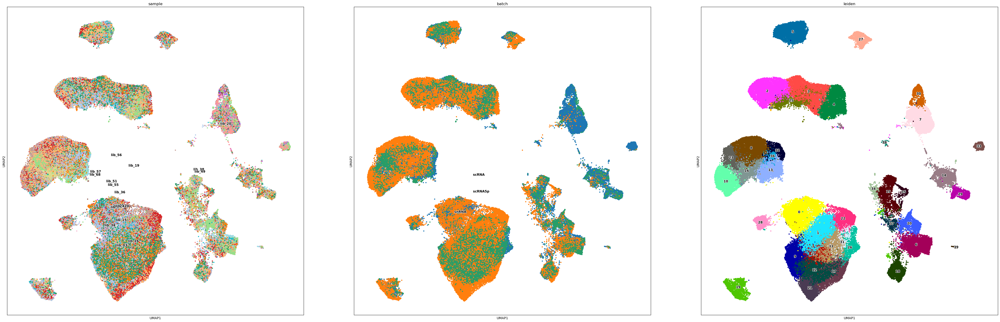

In [9]:
sc.pl.umap(adata, color = ['sample','batch','leiden'], size = 50, legend_loc='on data', legend_fontoutline=2)

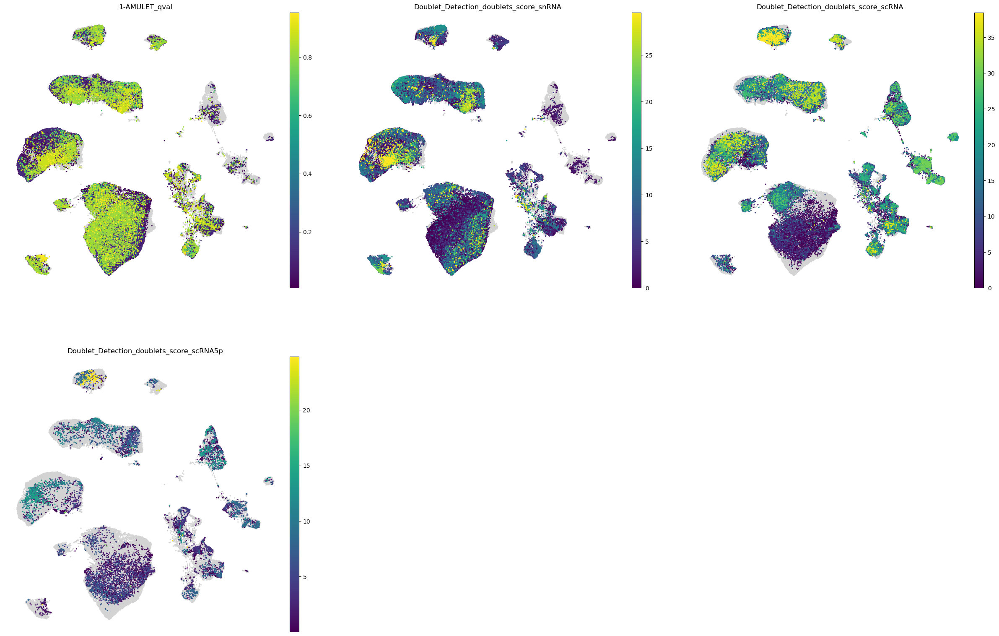

In [43]:
rcParams['figure.figsize'] = (9,9)
sc.pl.umap(adata, color = ['1-AMULET_qval','Doublet_Detection_doublets_score_snRNA','Doublet_Detection_doublets_score_scRNA','Doublet_Detection_doublets_score_scRNA5p'], size = 20,cmap ='viridis', ncols=3,frameon=False, vmax='p99', groups=[True,'True'])

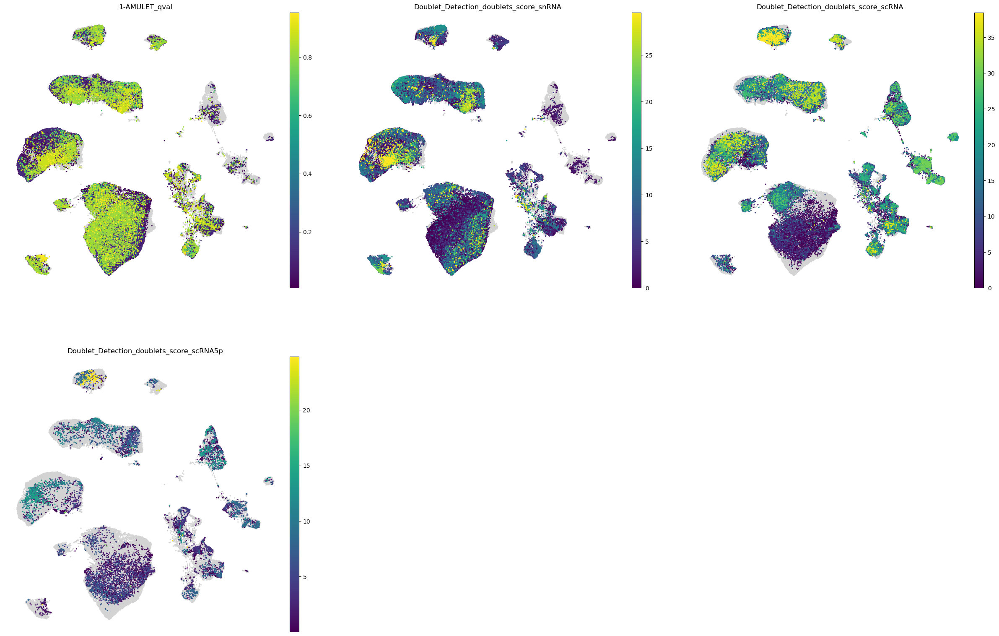

In [43]:
rcParams['figure.figsize'] = (9,9)
sc.pl.umap(adata, color = ['1-AMULET_qval','Doublet_Detection_doublets_score_snRNA','Doublet_Detection_doublets_score_scRNA','Doublet_Detection_doublets_score_scRNA5p'], size = 20,cmap ='viridis', ncols=3,frameon=False, vmax='p99', groups=[True,'True'])

In [30]:
adata = sc.read('objects/Integration_scVI_Clean_retrained.h5ad')
X_scVI = adata.obsm['X_scVI'].copy()
X_umap = adata.obsm['X_umap'].copy()
obs = adata.obs.copy()

In [31]:
adata = sc.read('objects/Integration_scVI_Clean.h5ad')

In [32]:
adata.obs = obs

In [34]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [35]:
sc.tl.rank_genes_groups(adata, method='wilcoxon', groupby='leiden')

/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/marioam/miniconda3/envs/General_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_grou

In [48]:
adata.obsm['X_umap'] = X_umap
adata.obsm['X_scVI'] = X_scVI

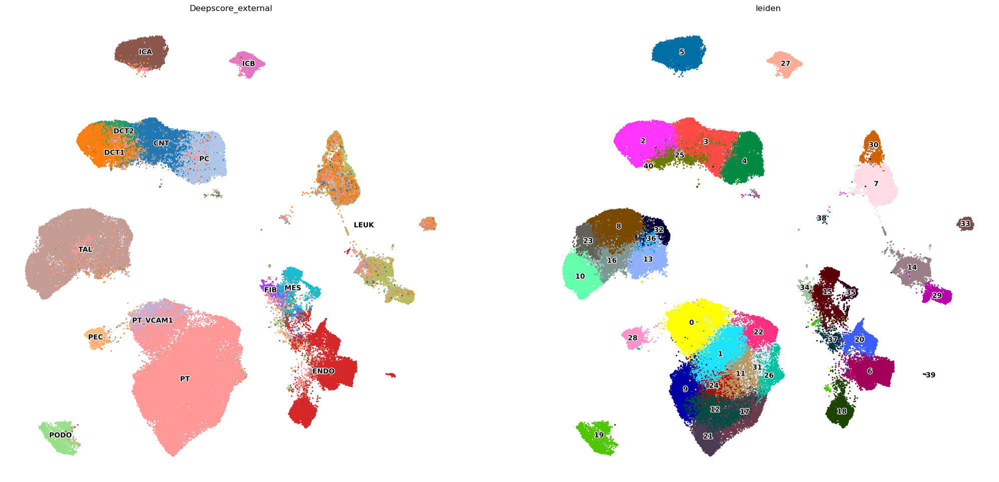

In [41]:
rcParams['figure.figsize'] = (12,12)
sc.pl.umap(adata, color = ['Deepscore_external','leiden'],frameon=False, size = 20, ncols=3, vmax='p99', legend_loc='on data',  legend_fontoutline = 2 )

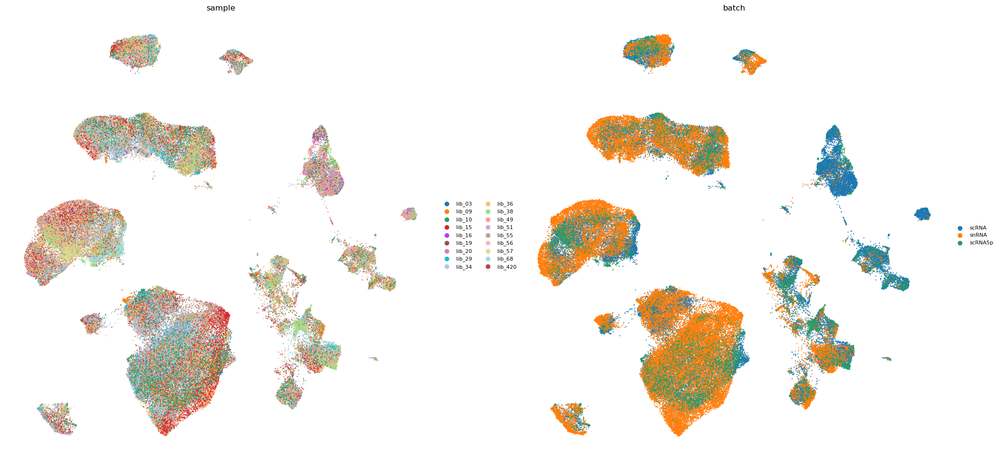

In [42]:
rcParams['figure.figsize'] = (12,12)
sc.pl.umap(adata, color = ['sample','batch'], size = 10,frameon=False,legend_fontsize=8, legend_fontoutline=2)

In [38]:
sc.tl.dendrogram(adata, use_rep='X_scVI', groupby='leiden')


# Identify again potential LowQ clusters

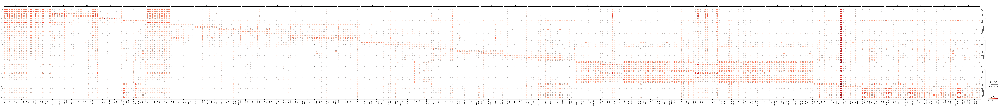

In [39]:
sc.pl.rank_genes_groups_dotplot(adata, vmax=5)

In [20]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key: result[key][group]
    for group in groups for key in ['names','scores','pvals','pvals_adj','logfoldchanges']}).to_csv('markers/Global_RNA_Integrated_leiden_NEW.csv')

In [21]:
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','scores','pvals','pvals_adj','logfoldchanges']})

,0_n,0_s,0_p,0_l,1_n,1_s,1_p,1_l,2_n,2_s,...,38_p,38_l,39_n,39_s,39_p,39_l,40_n,40_s,40_p,40_l
0,ITGB8,78.594055,0.000000e+00,2.680367,CUBN,91.570381,0.0,2.880630,SLC12A3,122.301079,...,2.881993e-150,4.804980,MMRN1,17.195578,1.432942e-62,10.311588,DST,11.476942,8.613329e-27,3.145907
1,ACSM2A,70.174492,0.000000e+00,1.728842,ACSM2A,81.843132,0.0,2.778325,WNK1,97.995056,...,1.250163e-145,10.747816,CCL21,17.063540,6.930875e-62,11.045282,ADAMTS17,11.217720,8.344127e-26,5.013453
2,TPM1,69.023804,0.000000e+00,2.417339,LRP2,80.903435,0.0,2.748531,TMEM52B,94.927696,...,2.363629e-120,4.071151,FABP4,16.342766,8.163175e-57,8.985247,VEGFA,11.020340,5.081740e-25,3.773666
3,RHEX,67.129654,0.000000e+00,3.530313,ACSM2B,80.830063,0.0,2.767536,EGF,89.747353,...,5.157140e-119,2.552019,TIMP3,15.961162,2.978180e-54,3.235888,GPHN,10.728708,9.329054e-24,2.272464
4,LINC01320,65.963165,0.000000e+00,1.781526,SYNE2,75.033524,0.0,1.968846,KNG1,84.232178,...,1.791828e-107,8.721593,TFF3,15.481507,4.625092e-51,8.046745,NEAT1,10.446416,1.521671e-22,1.457057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,AC019197.1,-30.101513,2.269294e-197,-2.539082,ACTB,-46.563068,0.0,-1.649044,SLC4A4,-31.416245,...,1.009588e-40,-5.082848,ESRRG,-9.161344,4.496067e-18,-5.263439,TXNIP,-6.818939,1.527929e-09,-2.689200
4996,CA12,-31.061623,4.228135e-210,-1.697995,TMSB4X,-46.969296,0.0,-2.887749,ACSM2A,-32.389568,...,5.124294e-41,-5.963618,COBLL1,-9.356084,8.112474e-19,-5.562376,TPT1,-7.039414,3.574995e-10,-2.461733
4997,PTGER3,-36.932713,1.149962e-296,-3.234434,B2M,-48.929947,0.0,-1.895342,TMSB4X,-37.197899,...,2.043102e-48,-2.673957,PKHD1,-9.854910,8.368629e-21,-4.977057,FTL,-7.765149,1.772816e-12,-2.997258
4998,ERBB4,-38.052666,0.000000e+00,-2.727800,S100A6,-49.017818,0.0,-2.521136,ZBTB16,-47.774387,...,1.629853e-52,-4.133960,ANK3,-10.265753,1.436191e-22,-6.135858,ITM2B,-8.173193,7.508307e-14,-2.882080


# SAVING FINAL RNA OBJECTS

In [52]:
adata.write('objects/Integration_scVI_Final.h5ad', compression='gzip')